In [1]:
# AI2 THOR
!pkill thor_*
import ai2thor
from ai2thor.controller import Controller,BFSController
from ai2thor.platform import CloudRendering
from ithor_tools.vis_tool import *
from ithor_tools.transform import cornerpoint_projection,depth2world
from ithor_tools.thor_detect import get_gt_box
from detector.thor import gather,gather3,detect
from eval_ithor.objects import choose_query_objects

from co_occurance.comet_co import co_occurance_score
import random
import math
# from IPython.display import display
# from moviepy.editor import ImageSequenceClip,VideoFileClip


# Planning Module
from RRT import gridmaprrt as rrt
from RRT import gridmaprrt_pathsmoothing as smoothing

from FBE.memory import fbe_map
from FBE.schedular import traj_schedular

Jupyter environment detected. Enabling Open3D WebVisualizer.
[Open3D INFO] WebRTC GUI backend enabled.
[Open3D INFO] WebRTCWindowSystem: HTTP handshake server disabled.
No implementation for OWOD


In [3]:
# Detector module
import torch
import cv2
import copy
import matplotlib.pyplot as plt

import sys
sys.path.append("./osod/")
from data.phase_1 import load_voc_instances,VOC_CLASS_NAMES
from structures.box import Boxes
from engine.predictor import DefaultPredictor

from config.config import get_cfg
from model.rcnn import GeneralizedRCNN
from detector.postprocess import postprocess,plot_openset,plot_candidate

## Matching Module
from detector.query_matching import matcher

In [4]:
'''
config file
'''

print(torch.cuda.device_count())
torch.cuda.set_device(0)
print(torch.cuda.current_device())
cfg = get_cfg()
cfg.merge_from_file('./osod/config_files/voc.yaml')

cfg.MODEL.SAVE_IDX=19

cfg.log = False 

cfg.MODEL.ROI_HEADS.USE_MLN = True
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 21
cfg.MODEL.RPN.AUTO_LABEL_TYPE = None
cfg.INPUT.RANDOM_FLIP = "none"
cfg.MODEL.ROI_BOX_HEAD.USE_FD = False
cfg.MODEL.ROI_HEADS.UNCT = True

cfg.PATH = 'osod'
cfg.phase = 'voc'
# cfg.merge_from_list(args.opts)
RPN_NAME = 'base'
ROI_NAME = 'mln' if cfg.MODEL.ROI_HEADS.USE_MLN else 'base'
MODEL_NAME = RPN_NAME + ROI_NAME
# cfg.merge_from_list(args.opts)
cfg.freeze()
# wandb.init(config=cfg,tags= 'temp',name = 'temp',project='temp')

2
0


In [26]:
device = 'cuda:1'
model = GeneralizedRCNN(cfg,device = device).to(device)
state_dict = torch.load('./osod/ckpt/baseline/{}_{}_15000.pt'.format(cfg.MODEL.SAVE_IDX,MODEL_NAME),map_location=device)
pretrained_dict = {k: v for k, v in state_dict.items() if k in model.state_dict()}
model.load_state_dict(pretrained_dict)

predictor = DefaultPredictor(cfg,model)

WARNING - 2022-08-31 18:50:24,501 - warnings - ./osod/model/rpn/rpn.py:43: UserWarning: nn.init.normal is now deprecated in favor of nn.init.normal_.
  nn.init.normal(layers.weight,std=0.01)

WARNING - 2022-08-31 18:50:24,539 - warnings - ./osod/model/rpn/rpn.py:44: UserWarning: nn.init.normal is now deprecated in favor of nn.init.normal_.
  nn.init.normal(layers.bias,0)



In [6]:
gridSize=0.05
scene_name = "FloorPlan_Val2_1"
controller = Controller(
    agentMode="locobot",
    platform=CloudRendering,
    AllowHorizontalMovement = True,
    visibilityDistance=2.5,
    scene = scene_name,
    gridSize=gridSize,
    movementGaussianSigma=0,
    rotateStepDegrees=90,
    rotateGaussianSigma=0,
    renderClassImage = True,
    renderDepthImage=False,
    renderInstanceSegmentation=False,
    width=300,
    height=300,
    fieldOfView=60
)

INFO - 2022-08-31 18:48:58,845 - controller - Initialize return: {'cameraNearPlane': 0.10000000149011612, 'cameraFarPlane': 20.0}


In [7]:
controller.reset(
    # makes the images a bit higher quality
    width=800,
    height=800,

    # Renders several new image modalities
    renderDepthImage=True,
    renderClassImage = True,
    renderSemanticSegmentation=False,
    renderNormalsImage=False
)
scene_bounds = controller.last_event.metadata['sceneBounds']['center']
controller.step(
    action="AddThirdPartyCamera",
    position=dict(x=scene_bounds['x'], y=3.0, z=scene_bounds['z']),
    rotation=dict(x=90, y=0, z=0),
    orthographic=True,
    orthographicSize= 5.0, fieldOfView=100,
    skyboxColor="white"
)
controller.step(dict(action='GetReachablePositions'))
rstate = controller.last_event.metadata['actionReturn']

controller.step(
    action="Teleport",
    position = rstate[100],
    rotation = dict(x=0,y=0,z=0)
)

pos = controller.last_event.metadata['agent']['position']
pos = [pos['x'],pos['z']]
objects = controller.last_event.metadata['objects']

In [8]:
df = show_objects_table(objects)
df

Object Metadata. Not showing objectOrientedBoundingBox, axisAlignedBoundingBox, and receptacleObjectIds for clarity.


,objectType,objectId,name,position[x],position[y],position[z],rotation[x],rotation[y],rotation[z],distance,...,openness,pickupable,isPickedUp,moveable,mass,salientMaterials,assetId,parentReceptacles,controlledObjects,isMoving
0,Book,Book|+09.17|+00.73|-04.22,Book_11,9.1707,0.7309,-4.2175,0.0459,349.6359,0.5575,1.4332,...,0.0,True,False,False,0.500,[Paper],Book_11,[Desk|+09.33|+00.00|-04.60],None,False
1,Box,Box|+03.49|+00.18|-04.63,Box_27,3.4889,0.1790,-4.6300,359.9738,79.8297,359.9929,4.3344,...,1.0,True,False,False,0.300,[Paper],Box_27,[Floor|+00.00|+00.00|+00.00],None,False
2,Book,Book|+09.17|+00.72|-04.21,Book_10,9.1737,0.7175,-4.2148,359.9633,353.7510,0.3243,1.4380,...,0.0,True,False,False,0.500,[Paper],Book_10,[Desk|+09.33|+00.00|-04.60],None,False
3,Box,Box|+04.00|+00.12|-04.63,Box_14,4.0030,0.1223,-4.6280,-0.0005,93.8673,0.0058,3.8411,...,1.0,True,False,False,0.300,[Paper],Box_14,[Floor|+00.00|+00.00|+00.00],None,False
4,Box,Box|+07.11|+00.53|-01.15,Box_11,7.1107,0.5347,-1.1513,359.9586,8.4392,0.0242,3.2338,...,1.0,True,False,False,0.300,[Paper],Box_11,"[SideTable|+07.12|+00.00|-01.27, Floor|+00.00|...",None,False
5,Book,Book|+09.16|+00.75|-04.22,Book_16,9.1643,0.7482,-4.2222,359.8070,356.3921,1.4275,1.4246,...,0.0,True,False,False,0.500,[Paper],Book_16,[Desk|+09.33|+00.00|-04.60],None,False
6,Bottle,Bottle|+04.47|+00.71|-02.00,Bottle_1,4.4740,0.7075,-2.0000,359.9660,359.9432,0.0292,4.0074,...,0.0,True,False,False,0.200,[Glass],Bottle_1,[DiningTable|+04.72|+00.00|-01.60],None,False
7,HousePlant,HousePlant|+04.72|+00.71|-01.51,Houseplant_6,4.7230,0.7097,-1.5069,0.0529,0.0134,359.8727,4.1232,...,0.0,False,False,True,3.000,"[Ceramic, Organic]",Houseplant_6,[DiningTable|+04.72|+00.00|-01.60],None,False
8,Watch,Watch|+08.85|+00.71|-02.41,Watch_2,8.8549,0.7087,-2.4111,2.3065,19.4246,359.3115,2.1968,...,0.0,True,False,False,0.070,"[Metal, Glass, Plastic]",Watch_2,[DiningTable|+09.16|+00.00|-02.55],None,False
9,Pencil,Pencil|+08.97|+00.61|-03.34,Pencil_2,8.9745,0.6052,-3.3358,-0.0038,169.9107,219.9320,1.5864,...,0.0,True,False,False,0.006,[Wood],Pencil_2,[SideTable|+08.93|+00.00|-03.36],None,False


In [9]:
query_object = objects[21]

In [10]:
in_landmark_names = ['dining table','sofa','tv monitor']
out_landmark_names = ['desk','drawer','side table','coffee table','bed','arm chair']
landmark_names = in_landmark_names+out_landmark_names

In [11]:
landmark_cat = landmark_names
co_occurance_scoring = co_occurance_score('cuda:0')



model loading ...


INFO - 2022-08-31 18:49:25,894 - utils - using task specific params for summarization: {'early_stopping': True, 'length_penalty': 2.0, 'max_length': 24, 'min_length': 1, 'no_repeat_ngram_size': 3, 'num_beams': 4}


model loaded


In [12]:
co_occurance_scoring.landmark_init(landmark_cat)

In [13]:
co_occurance = co_occurance_scoring.score(query_object['objectType'])
# co_occurance = [0]*len(landmark_cat)

WARNING - 2022-08-31 18:49:36,164 - warnings - /home/jeongeun/test_env/ITHOR_Navi/co_occurance/comet_co.py:41: UserWarning: [W008] Evaluating Doc.similarity based on empty vectors.
  sims.append(doc1.similarity(doc2))



In [14]:
co_occurance, landmark_cat

([0.353, 1.0, 0.458, 0.209, 0.324, 0.42, 0.283, 1.0, 0.749],
 ['dining table',
  'sofa',
  'tv monitor',
  'desk',
  'drawer',
  'side table',
  'coffee table',
  'bed',
  'arm chair'])

In [15]:
scene_bounds = controller.last_event.metadata['sceneBounds']['cornerPoints']
scene_bounds = cornerpoint_projection(scene_bounds)


In [16]:
scene_memory = fbe_map(scene_bounds,rstate,landmark_names=landmark_names, stepsize=0.1)
sche = traj_schedular(landmark_names,controller)
sche.set_score(co_occurance)

co_thres = 0.2
# if max(co_occurance)<co_thres:
#     co_thres = max(co_occurance)-0.2

In [17]:
clip_matcher = matcher(out_landmark_names,device='cuda:0')
clip_matcher.tokenize(query_object['objectType'])


In [18]:
controller.step(
    action="Teleport",
    position = rstate[100],
    rotation = dict(x=0,y=0,z=0)
)

<ai2thor.server.Event at 0x7f44a353c5e0
    .metadata["lastAction"] = Teleport
    .metadata["lastActionSuccess"] = True
    .metadata["errorMessage"] = "
    .metadata["actionReturn"] = None
>

In [19]:
from eval_ithor.reset import get_min_dis

min_dis = get_min_dis(query_object,controller,None,None)
print(min_dis)

4.517466954250447


In [20]:
rrtplanner = rrt.RRT(controller = controller, expand_dis=0.1,max_iter=10000,goal_sample_rate=20)
d2w = depth2world()

In [21]:
traj_image = controller.last_event.third_party_camera_frames[0]

In [22]:
detection_labels = []
for l in in_landmark_names:
    detection_labels.append(VOC_CLASS_NAMES.index(l.replace(" ","")))
print(detection_labels)

[10, 17, 19]


In [23]:
opos = query_object['position']

In [24]:
random.seed(100)
np.random.seed(100)
torch.random.manual_seed(100)

WARNING - 2022-08-31 18:50:40,169 - warnings - /home/jeongeun/.pyenv/versions/3.8.8/envs/ai2thor_test/lib/python3.8/site-packages/torch/functional.py:445: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2157.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]



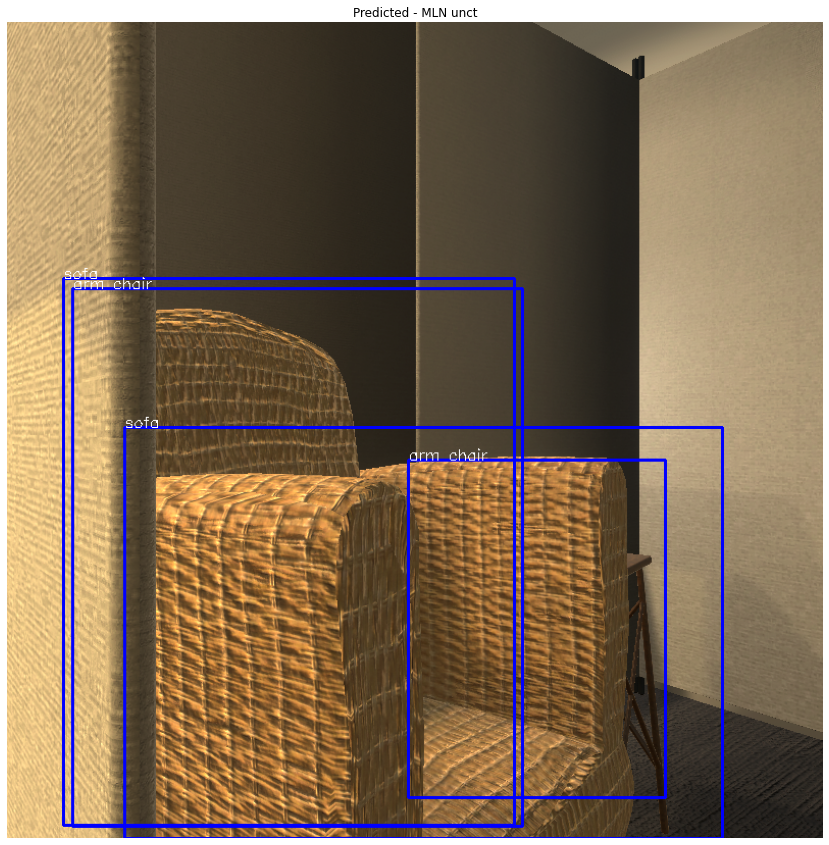

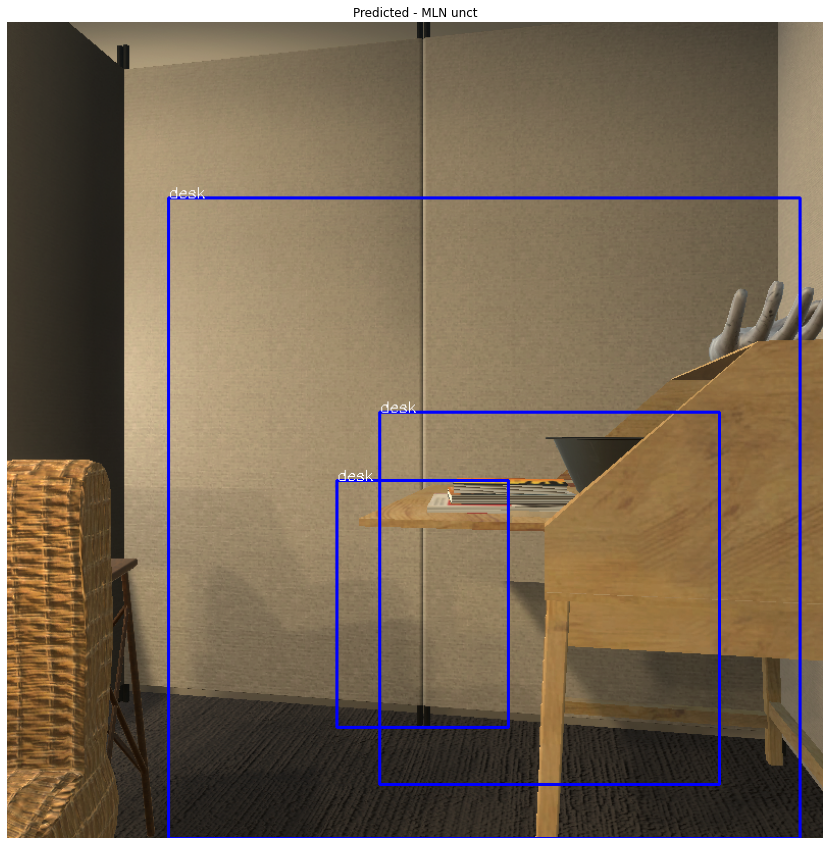

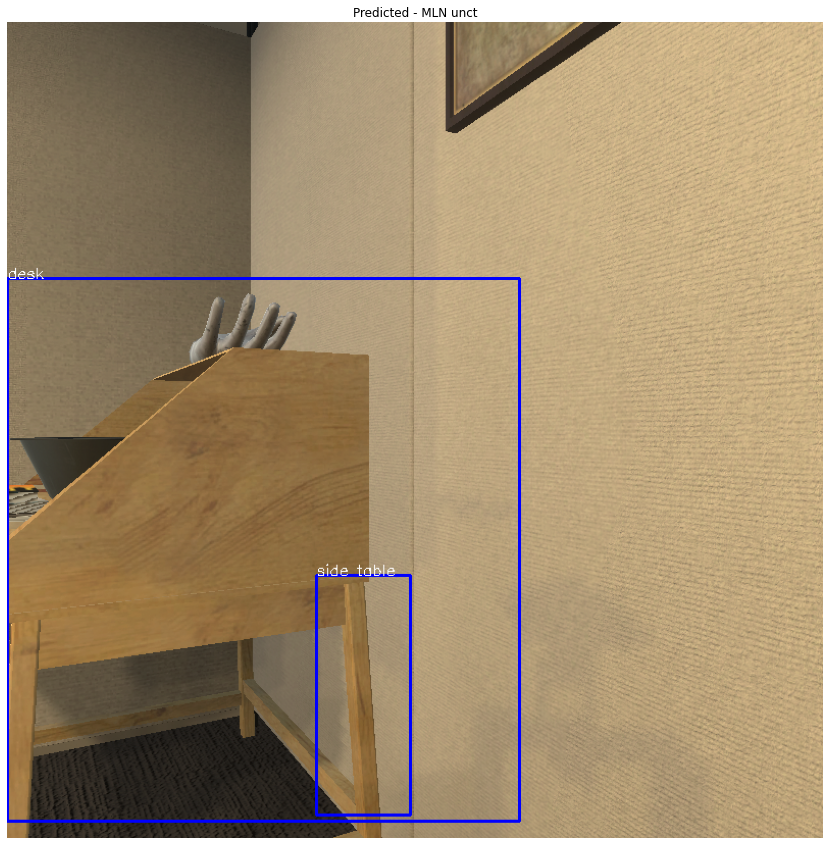

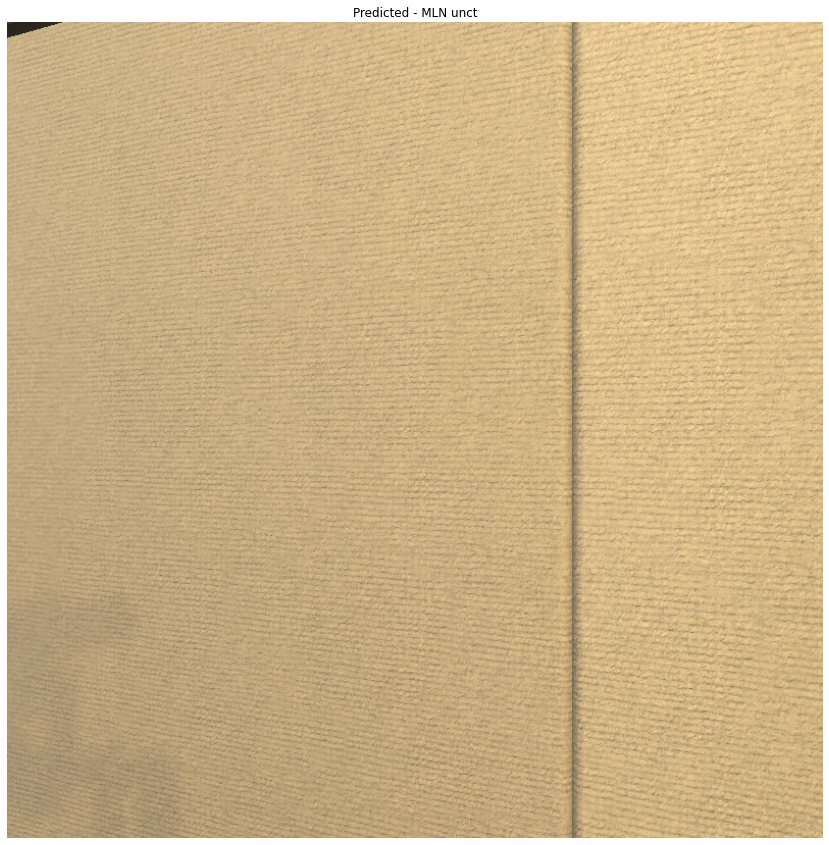

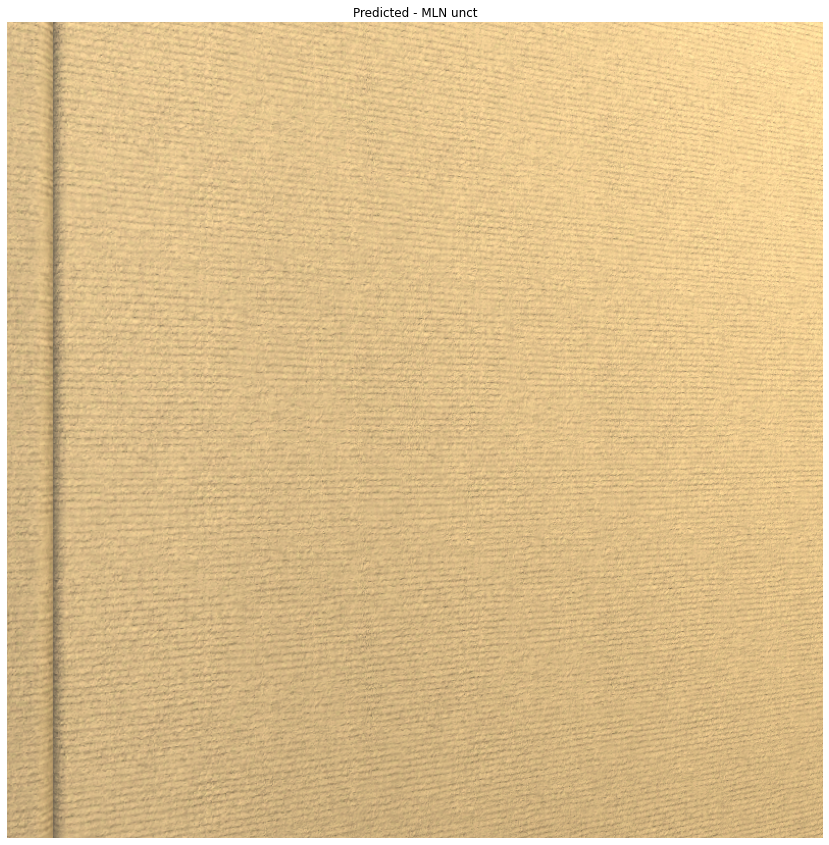

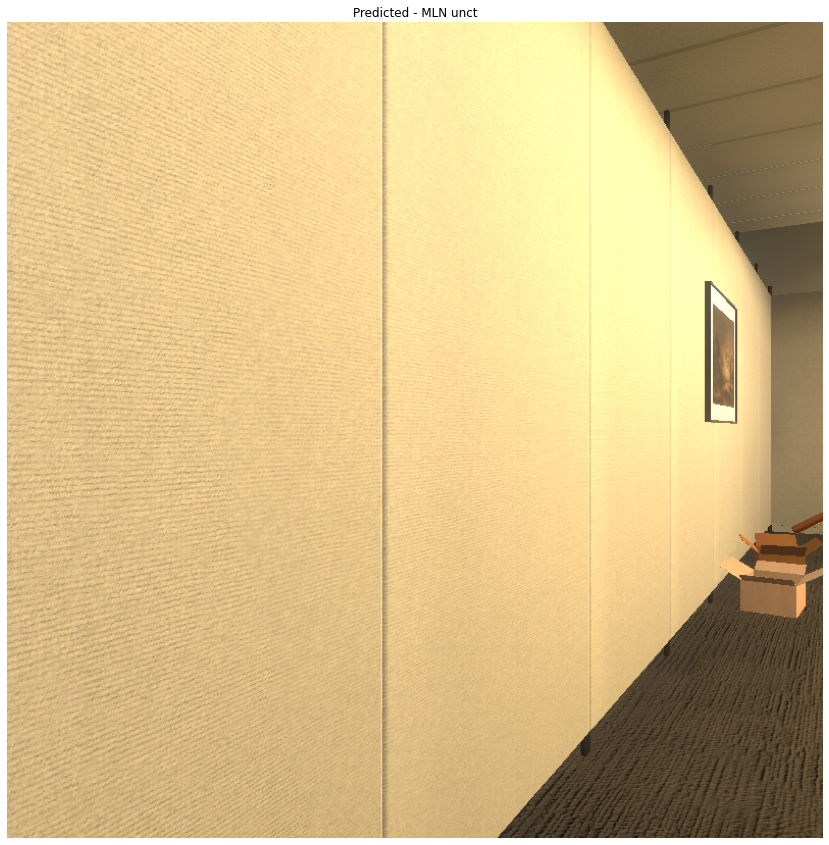

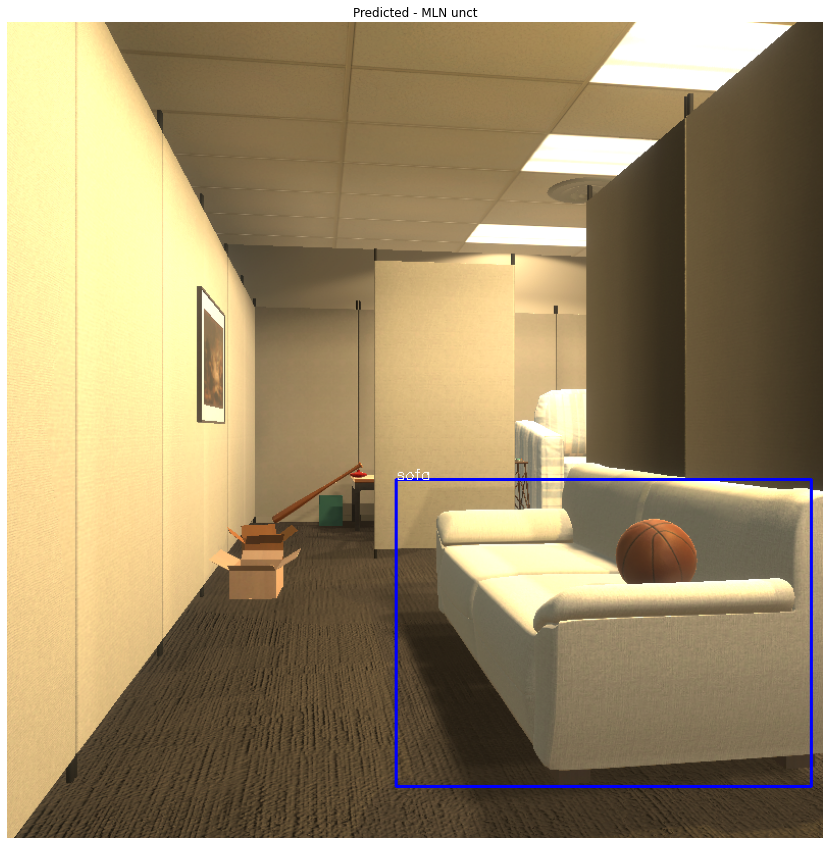

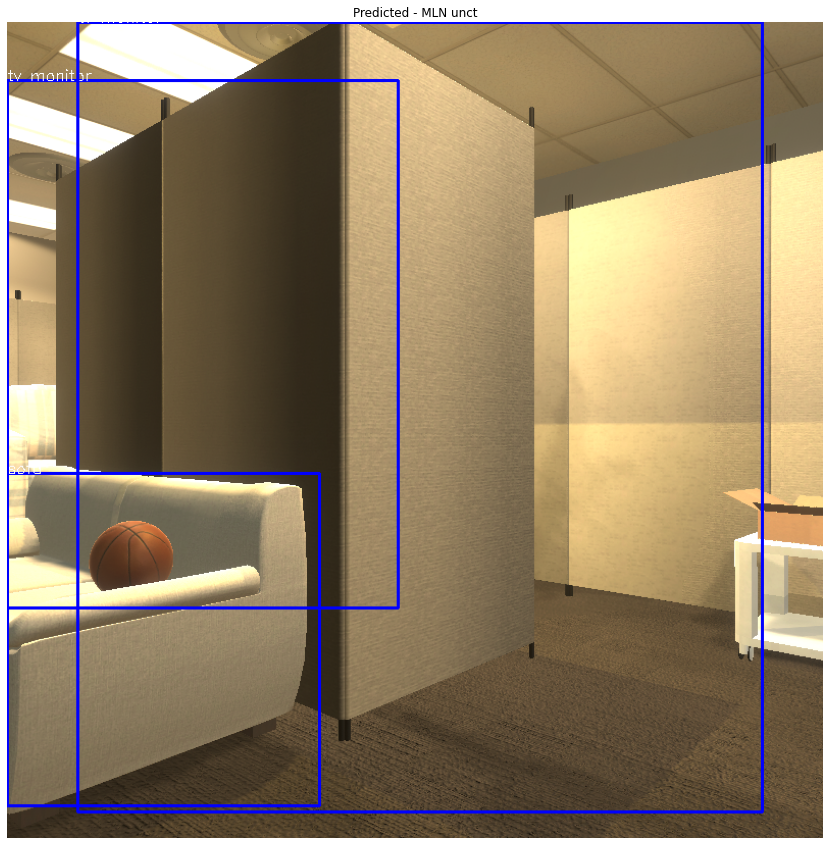

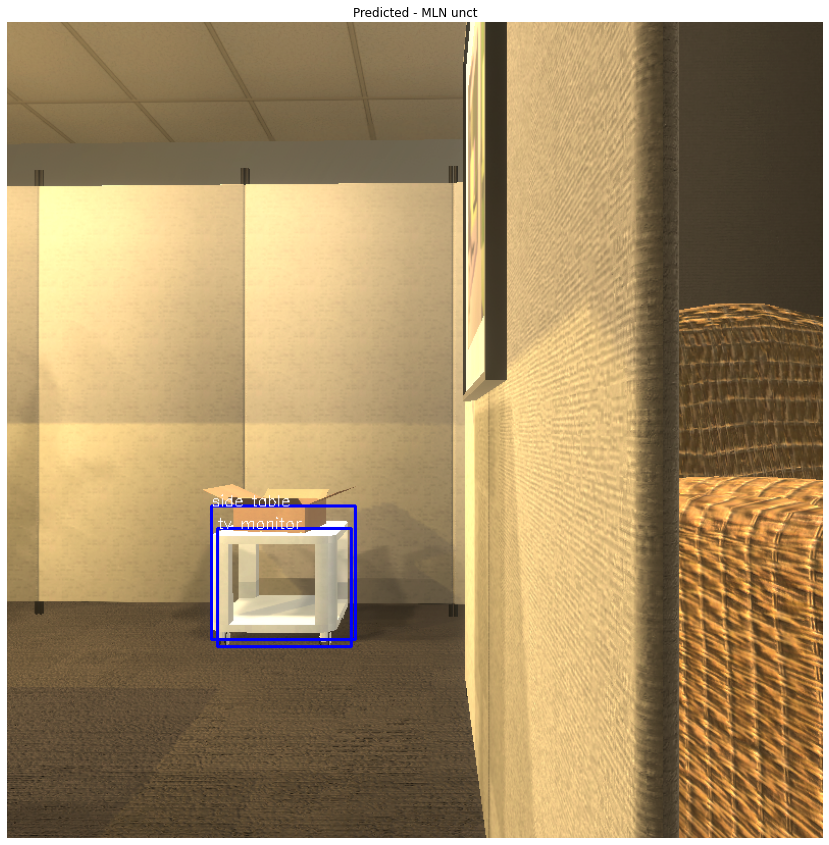

gt_vis? 0


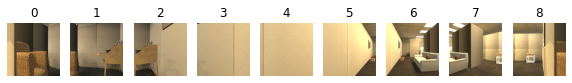

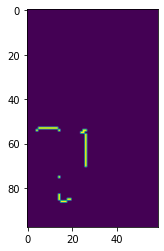

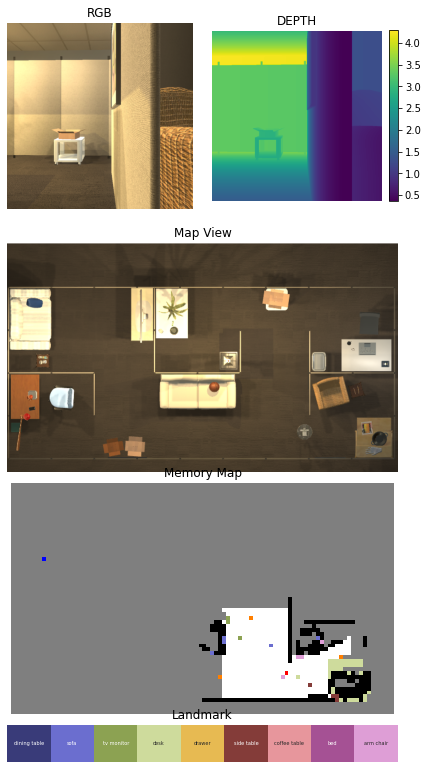

In [27]:
total_patch = np.zeros((0,256,256,3),dtype=np.uint8)
total_mappoints = []
total_success = 0
total_path_len = 0

frames,single_pos,gt_boxes,gt_vis,detected_landmarks = gather3(controller,[query_object['objectId']],opos,
                        predictor,postprocess,clip_matcher,detection_labels,scene_memory,visualize=True)
print('gt_vis?',gt_vis)
candidate_patches, candidate_map_points,sucesses = detect(frames,single_pos,gt_boxes,controller,predictor,
                                    clip_matcher,d2w,visualize = False)

total_patch = np.concatenate((total_patch,candidate_patches),axis=0)
total_mappoints += candidate_map_points
total_success += sucesses
vis_panorama(frames,res=360)
scene_memory.visited(controller)
landmark_config = dict(name=landmark_names,color = scene_memory.landmark_colors)
cpos = controller.last_event.metadata['agent']['position']
candidate_trajs = []
uncts = []
for l in detected_landmarks:
    res = scene_memory.get_reachable(cpos,l)
    if not res[0] == None:
        uncts.append(res[3])
        res = dict(name=l,pos=res[0],rot = res[1])
        candidate_trajs.append(res)
        
waypoints = scene_memory.frontier_detection(cpos)
candidate_trajs += waypoints
uncts += [0]*len(waypoints)

cpos = controller.last_event.metadata['agent']['position']
imshow_grid = scene_memory.plot(controller.last_event.metadata['agent']['position'],candidate_trajs,query_object['position'])
plot_frames2(controller.last_event,imshow_grid,landmark_config)     

In [ ]:

NUM_WAYPOINT = 0
def draw_path(rrt,traj_image,path):
    traj_image = np.ascontiguousarray(traj_image, dtype=np.uint8)
    for idx in range(len(path)-1):
        prev_xz = rrt.rstate[path[idx]]
        next_xz = rrt.rstate[path[idx+1]]
        prev_w,prev_h = rrt.play_area.xz2coor(prev_xz[0],prev_xz[1])
        next_w,next_h = rrt.play_area.xz2coor(next_xz[0],next_xz[1])
        cv2.line(traj_image, (int(prev_w),int(prev_h)), (int(next_w),int(next_h)), (0,255,255), 2)
    # plt.imshow(traj_image)
    # plt.plot(path_wh[:,0], path_wh[:,1],'-c')

    # Cast start&end point coordinate in image
    # startx, startz = (rrt.start.x), (rrt.start.z)
    endx,   endz   = (rrt.end.x), (rrt.end.z)
    
    # startx, startz = rrt.play_area.xz2coor(startx, startz )
    endx,   endz   = rrt.play_area.xz2coor(endx,   endz   )
    
    # plt.plot(startx, startz,"xr")
    cv2.circle(traj_image, (int(endx),int(endz)), 5, (255,0,255), thickness=5)
    cv2.putText(traj_image, str(NUM_WAYPOINT), (int(endx),int(endz)), cv2.FONT_HERSHEY_SIMPLEX, 1, (0,0,0), 2)
    # plt.plot(endx, endz, "xr")
    plt.imshow(traj_image)
    plt.show()
    return traj_image


In [ ]:
angle = 200
step = 5
while not total_success:
    cpos = controller.last_event.metadata['agent']['position']
    path = sche.schedule(cpos,0,candidate_trajs,uncts,co_thres = co_thres)
    print(path)
    for p in path[1:]:
        if p == None:
            scene_memory.reset_gridmap()
            print('expolaration done')
            break
        # print(p)
        pos = controller.last_event.metadata['agent']['position']
        rrtplanner.set_start(pos)
        rrtplanner.set_goal(p['pos'])
        print("start planning")
        local_path = rrtplanner.planning(animation=False)
        try:
            smoothpath = smoothing.path_smoothing(rrtplanner,40,verbose=False)
        except:
            smoothpath = local_path
        to_pos = rrtplanner.rstate[smoothpath[-1]]
        # rrtplanner.plot_path(smoothpath)
        NUM_WAYPOINT +=1
        traj_image = draw_path(rrtplanner,traj_image,smoothpath)
        
        print("end planning")
        flag,path_len,frames = rrtplanner.go_with_teleport(smoothpath,maxspeed=0.2)
        print("end move")
        total_path_len += path_len
        
        # video = ImageSequenceClip(frames, fps=10)
        # video.write_gif('temp_{}.gif'.format(NUM_WAYPOINT))

        if p['name'] == 'frontier':
            # controller.step(
            # action="Teleport",
            # position = dict(x=to_pos[0],y=0.91,z=to_pos[1]), rotation = dict(x=0,y=0,z=0)
            #     )
            # print(controller.last_event.metadata['lastActionSuccess'])
            scene_memory.reset_landmark(detected_landmarks)
            frames,single_pos,gt_boxes,gt_vis,detected_landmarks = gather3(controller,[query_object['objectId']],opos,
                        predictor,postprocess,clip_matcher,detection_labels,scene_memory,vis=True)
            print('gt_vis?',gt_vis)
            candidate_patches, candidate_map_points,sucesses = detect(frames,single_pos,gt_boxes,controller,
                                predictor,clip_matcher,d2w,visualize = bool(gt_vis))
            total_patch = np.concatenate((total_patch,candidate_patches),axis=0)
            total_mappoints += candidate_map_points
            total_success += sucesses
            vis_panorama(frames,res=360)

            scene_memory.visited(controller)
            landmark_config = dict(name=landmark_names,color = scene_memory.landmark_colors)
            cpos = controller.last_event.metadata['agent']['position']
            candidate_trajs = []
            uncts = []
            for l in detected_landmarks:
                res = scene_memory.get_reachable(cpos,l)
                if not res[0] == None:
                    uncts.append(res[3])
                    res = dict(name=l,pos=res[0],rot = res[1])
                    candidate_trajs.append(res)
                    
            waypoints = scene_memory.frontier_detection(cpos)
            candidate_trajs += waypoints
            uncts += [0]*len(waypoints)
        else:
            pos = controller.last_event.metadata['agent']['position']
            controller.step(
                action="Teleport",
                position = pos, rotation = dict(x=0,y=p['rot']-angle/2,z=0)
                    )
            print(controller.last_event.metadata['lastActionSuccess'])
            imshow_grid = scene_memory.plot(controller.last_event.metadata['agent']['position'],candidate_trajs,query_object['position'])
            plot_frames2(controller.last_event,imshow_grid,landmark_config)
            frames, single_pos,gt_boxes,gt_vis = gather(controller,[query_object['objectId']],opos,step=step,angle=angle)
            print('gt_vis?',gt_vis)
            candidate_patches, candidate_map_points,sucesses = detect(frames,single_pos,gt_boxes,controller,
                            predictor,clip_matcher,d2w,visualize = bool(gt_vis))
            total_patch = np.concatenate((total_patch,candidate_patches),axis=0)
            total_mappoints += candidate_map_points
            total_success += sucesses
            vis_panorama(frames,res=angle)
            
        cpos = controller.last_event.metadata['agent']['position']
        imshow_grid = scene_memory.plot(controller.last_event.metadata['agent']['position'],candidate_trajs,query_object['position'])
        plot_frames2(controller.last_event,imshow_grid,landmark_config)  
        if total_success:
            break      


[{'name': 'current', 'pos': {'x': 8.649999618530273, 'y': 0.9009996652603149, 'z': -4.399999618530273}, 'rot': 0}, {'name': 'sofa', 'pos': {'x': 8.4, 'y': 0.9009996652603149, 'z': -4.300000000000001}, 'rot': 360.0}, {'name': 'side table', 'pos': {'x': 8.1, 'y': 0.9009996652603149, 'z': -4.000000000000001}, 'rot': 45.0}, {'name': 'frontier', 'pos': {'x': 7.000000000000001, 'y': 0.9009996652603149, 'z': -4.200000000000001}, 'rot': None}]
start planning


NameError: name 'NUM_WAYPOINT' is not defined

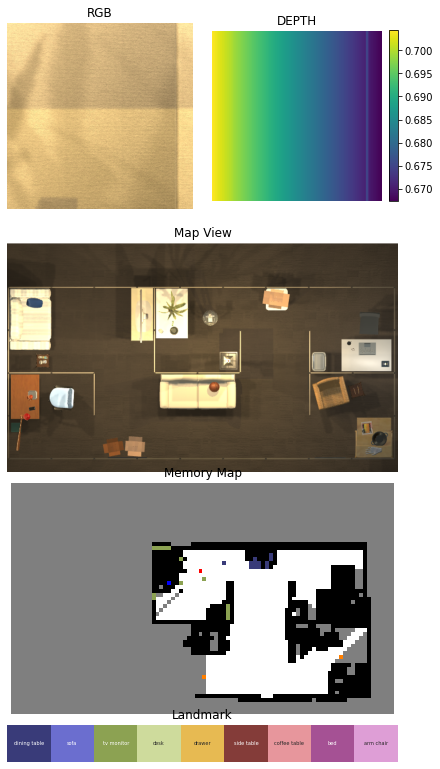

Sucess? True
Total Path Length 13.630853177290707
SPL: 0.23253847157346744
Total Number of Wapoints 11


In [ ]:

cpos = controller.last_event.metadata['agent']['position']
imshow_grid = scene_memory.plot(controller.last_event.metadata['agent']['position'],candidate_trajs,query_object['position'])
plot_frames2(controller.last_event,imshow_grid,landmark_config)  

print("Sucess?",total_success>0)
print("Total Path Length", total_path_len)
SPL = (total_success>0)*min_dis/total_path_len
print("SPL:",SPL )
print("Total Number of Wapoints",NUM_WAYPOINT)
plot_candidate(total_patch,total_mappoints,query_object['objectType'],scene_memory)

In [ ]:
controller.stop_unity()